In [131]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import category_encoders as ce
from category_encoders.one_hot import OneHotEncoder, OrdinalEncoder
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [5]:
import os
for dirname, _, filenames in os.walk('C:\\Users\\RenanSardinha\\Documents\\Data Science\\EstimatedObesityLevels\\Data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\RenanSardinha\Documents\Data Science\EstimatedObesityLevels\Data\Data_Description.csv
C:\Users\RenanSardinha\Documents\Data Science\EstimatedObesityLevels\Data\ObesityDataSet_raw_and_data_sinthetic.csv


In [6]:
# Load Data
dataset = pd.read_csv('C:\\Users\\RenanSardinha\\Documents\\Data Science\\EstimatedObesityLevels\\Data\\ObesityDataSet_raw_and_data_sinthetic.csv')

description = pd.read_csv('C:\\Users\\RenanSardinha\\Documents\\Data Science\\EstimatedObesityLevels\\Data\\Data_Description.csv')

In [7]:
description

,Variable,Definition,Key
0,Gender,Gender,"Female, Male"
1,Age,Age in years,Numeric values
2,Height,Height in meters,Numeric values
3,Weight,Weight in Kilograms,Numeric values
4,family_history_with_overweight,Has a family member suffered or suffers from o...,"Yes, No"
5,FAVC,Do you eat high caloric food frequently?,"Yes, No"
6,FCVC,Do you usually eat vegetables in your meals?,"Never, Sometimes, Always"
7,NCP,How many main meals do you have daily?,"Between 1 and 2, 3, More than 3 times"
8,CAEC,Do you eat any food between meals?,"No, Sometimes, Frequently, Always"
9,SMOKE,Do you smoke?,"Yes, No"


In [8]:
%matplotlib inline
dataset.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

### Data Exploration

### For Numeric Data
- Made histograms to understand distributions
- Corrplot
- Pivot table comparing NObeyesdad levels across numeric variables

### For Categorical Data
- Made bar charts to understand balance of classes
- Made pivot tables to understand relationship with NObeyesdad

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [10]:
dataset.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


In [11]:
# Quick way to separate numeric columns
dataset.describe().columns

Index(['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'], dtype='object')

In [12]:
# Look at numeric and categorical values separately 
df_num = dataset[['Age', 'Height', 'Weight']]
df_cat = dataset[['Gender', 'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad']]

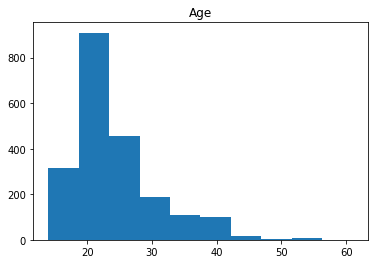

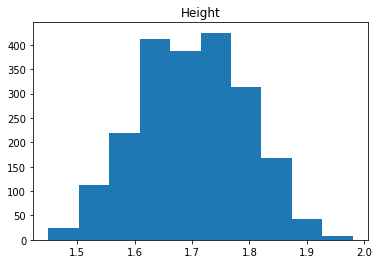

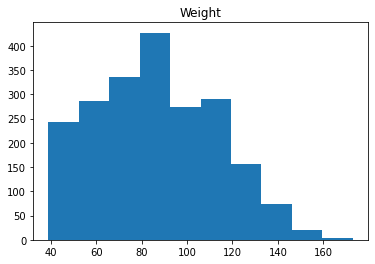

In [13]:
# Distributions for all numeric variables
for i in df_num.columns:
    plt.hist(df_num[i])
    plt.title(i)
    plt.show()

             Age    Height    Weight
Age     1.000000 -0.025958  0.202560
Height -0.025958  1.000000  0.463136
Weight  0.202560  0.463136  1.000000


<AxesSubplot:>

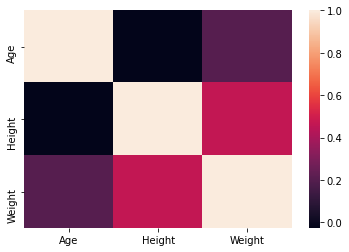

In [14]:
print(df_num.corr())
sns.heatmap(df_num.corr())

In [15]:
# Compare NObeyesdad levels across Age, Height, Weight
pd.pivot_table(dataset, index = 'NObeyesdad', values = ['Age','Height','Weight'])

,Age,Height,Weight
NObeyesdad,,,
Insufficient_Weight,19.783237,1.691117,49.906330
Normal_Weight,21.738676,1.676585,62.155052
Obesity_Type_I,25.884941,1.693804,92.870198
Obesity_Type_II,28.233785,1.771795,115.305311
Obesity_Type_III,23.495554,1.687559,120.941114
Overweight_Level_I,23.417674,1.687836,74.266828
Overweight_Level_II,26.996981,1.703748,82.085271


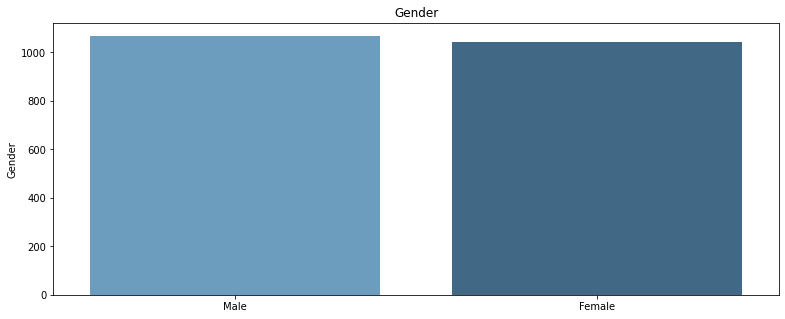

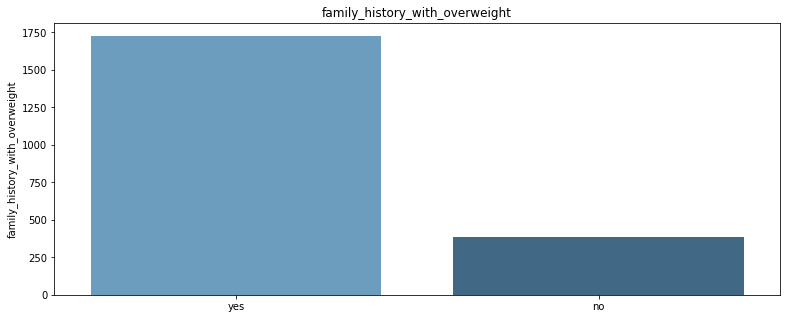

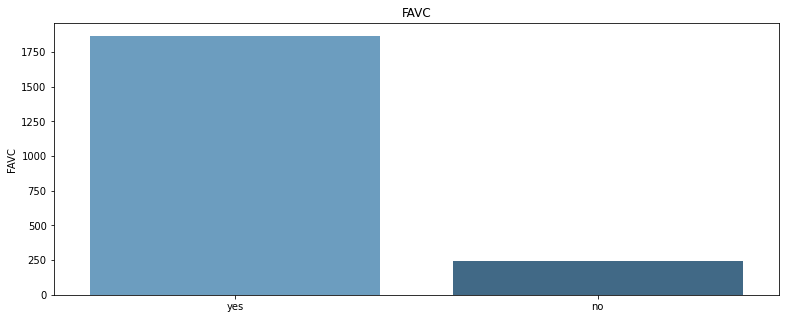

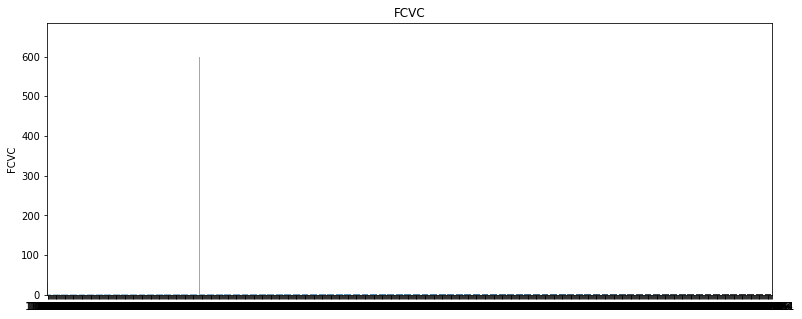

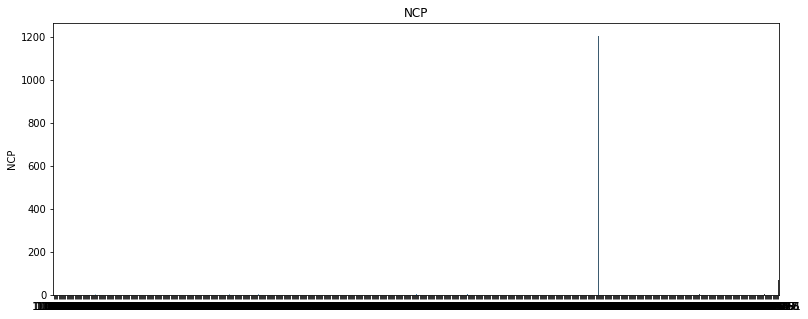

...

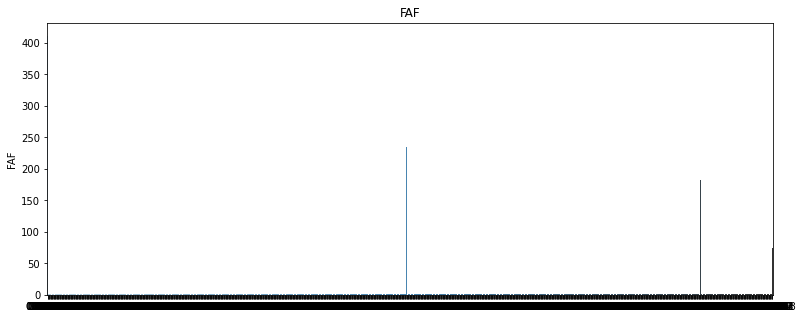

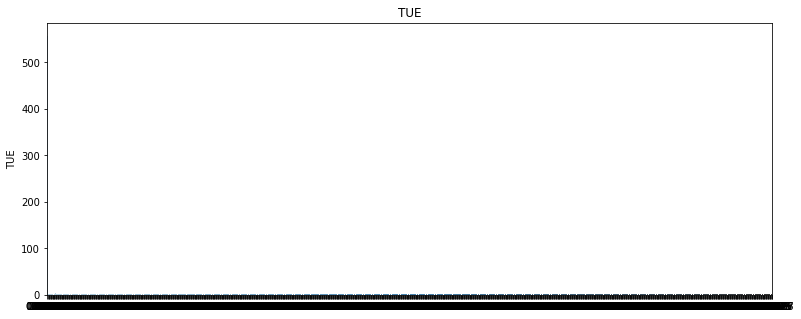

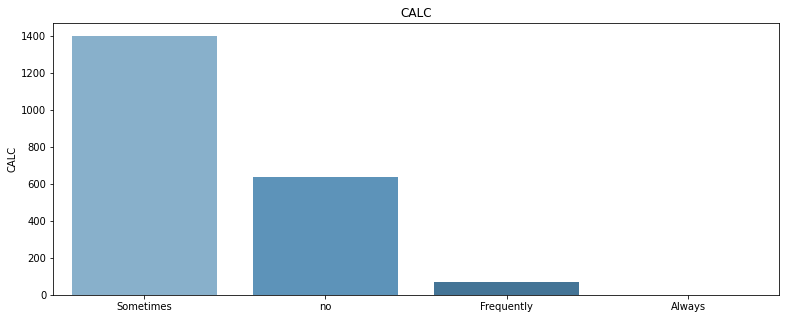

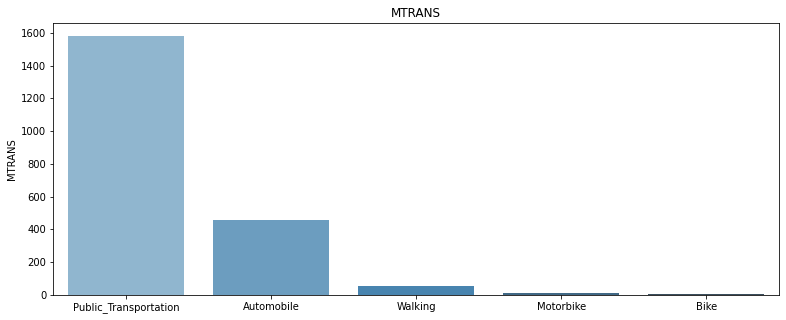

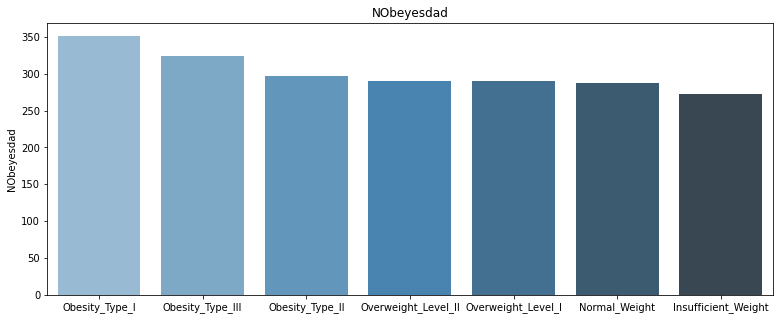

In [96]:
# Categorical variables
for i in df_cat.columns:
    plt.figure(figsize=(13, 5))
    sns.barplot(df_cat[i].value_counts().index,df_cat[i].value_counts(), palette="Blues_d").set_title(i)
    plt.show()

In [18]:
# Comparing NObeyesdad and each of these categorical variables 
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'Gender', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'family_history_with_overweight', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'FAVC', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'CAEC', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'SMOKE', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'SCC', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'CALC', values = 'FAF' ,aggfunc ='count'))
print()
print(pd.pivot_table(dataset, index = 'NObeyesdad', columns = 'MTRANS', values = 'FAF' ,aggfunc ='count'))

Gender               Female  Male
NObeyesdad                       
Insufficient_Weight     173    99
Normal_Weight           141   146
Obesity_Type_I          156   195
Obesity_Type_II           2   295
Obesity_Type_III        323     1
Overweight_Level_I      145   145
Overweight_Level_II     103   187

family_history_with_overweight     no    yes
NObeyesdad                                  
Insufficient_Weight             146.0  126.0
Normal_Weight                   132.0  155.0
Obesity_Type_I                    7.0  344.0
Obesity_Type_II                   1.0  296.0
Obesity_Type_III                  NaN  324.0
Overweight_Level_I               81.0  209.0
Overweight_Level_II              18.0  272.0

FAVC                 no  yes
NObeyesdad                  
Insufficient_Weight  51  221
Normal_Weight        79  208
Obesity_Type_I       11  340
Obesity_Type_II       7  290
Obesity_Type_III      1  323
Overweight_Level_I   22  268
Overweight_Level_II  74  216

CAEC                 Alwa

In [19]:
df = dataset.copy()
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


#### FCVC, NCP, CH2O, FAF and TUE charts are very messy on barplot;
#### Applied the round function with: Age, Height, Weight, FCVC, NCP, CH20, FAF, TUE;

In [30]:
df['Age'] = df['Age'].apply(lambda age : round(age)) 
df['Height'] = df['Height'].apply(lambda height : round(height, 2)) 
df['Weight'] = df['Weight'].apply(lambda weight : round(weight)) 
df['FCVC'] = dataset['FCVC'].apply(lambda fcvc : round(fcvc)) 
df['NCP'] = df['NCP'].apply(lambda ncp : round(ncp)) 
df['CH2O'] = df['CH2O'].apply(lambda ch2o : round(ch2o)) 
df['FAF'] = df['FAF'].apply(lambda faf : round(faf)) 
df['TUE'] = df['TUE'].apply(lambda tue : round(tue))

In [21]:
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21,1.62,64,yes,no,2,3,Sometimes,no,2,no,0,1,no,Public_Transportation,Normal_Weight
1,Female,21,1.52,56,yes,no,3,3,Sometimes,yes,3,yes,3,0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23,1.80,77,yes,no,2,3,Sometimes,no,2,no,2,1,Frequently,Public_Transportation,Normal_Weight
3,Male,27,1.80,87,no,no,3,3,Sometimes,no,2,no,2,0,Frequently,Walking,Overweight_Level_I
4,Male,22,1.78,90,no,no,2,1,Sometimes,no,2,no,0,0,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,21,1.71,131,yes,yes,3,3,Sometimes,no,2,no,2,1,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,22,1.75,134,yes,yes,3,3,Sometimes,no,2,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,23,1.75,134,yes,yes,3,3,Sometimes,no,2,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24,1.74,133,yes,yes,3,3,Sometimes,no,3,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III


In [22]:
df['FAF'].value_counts()

1    776
0    720
2    496
3    119
Name: FAF, dtype: int64

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

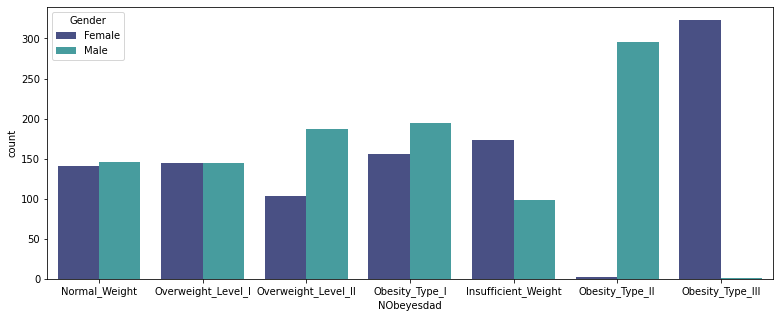

In [25]:
# Data Visualization
plt.figure(figsize=(13,5)) 
sns.countplot(x='NObeyesdad', hue='Gender', data=df, palette='mako')

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

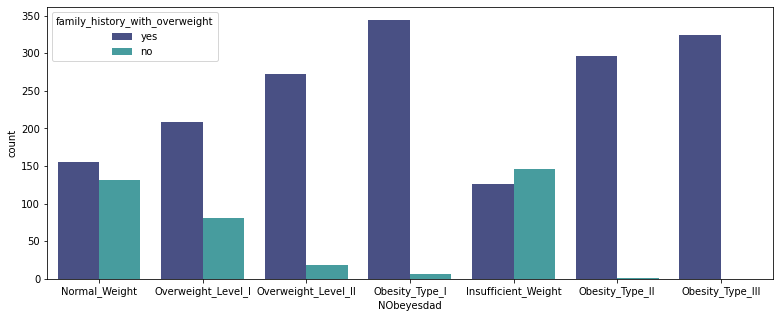

In [45]:
plt.figure(figsize=(13,5)) 
sns.countplot(x='NObeyesdad', hue='family_history_with_overweight', data=df, palette='mako')

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

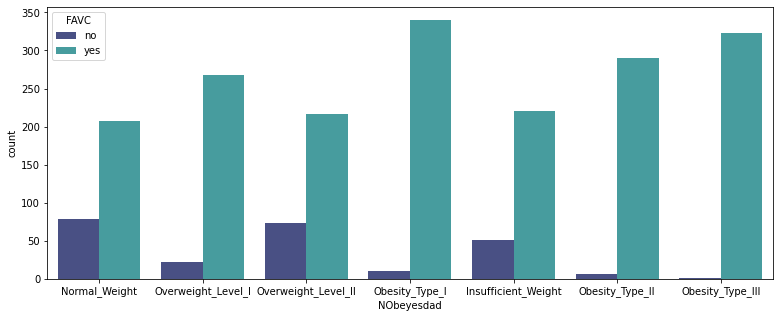

In [46]:
# Do you eat high caloric food frequently?
plt.figure(figsize=(13,5)) 
sns.countplot(x='NObeyesdad', hue='FAVC', data=df, palette='mako')

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

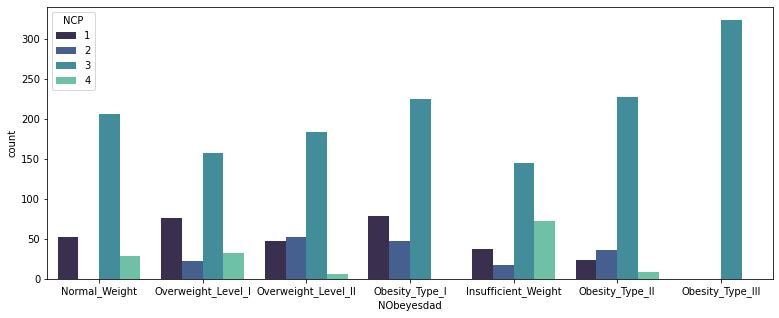

In [47]:
# How many main meals do you have daily?
plt.figure(figsize=(13,5))
sns.countplot(x='NObeyesdad', hue='NCP', data=df, palette='mako')

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

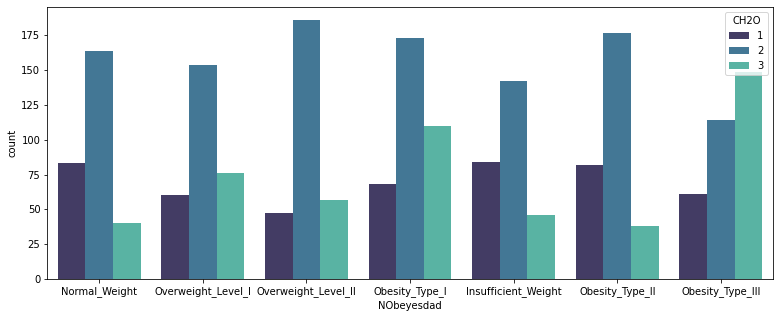

In [48]:
plt.figure(figsize=(13,5))
sns.countplot(x='NObeyesdad', hue='CH2O', data=df, palette='mako')

<AxesSubplot:xlabel='NObeyesdad', ylabel='count'>

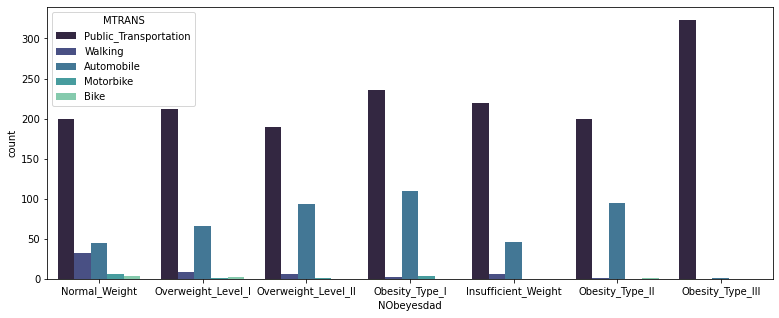

In [49]:
plt.figure(figsize=(13,5))
sns.countplot(x='NObeyesdad', hue='MTRANS', data=df, palette='mako')

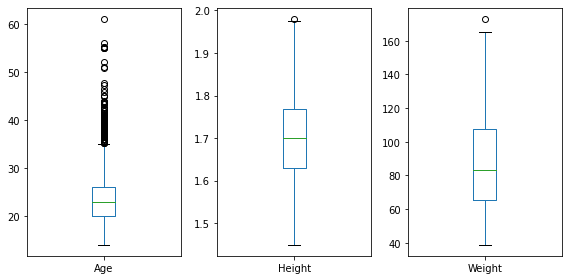

In [49]:
# Outliers Detection

plt.figure(figsize=(8,4))

for i, col in enumerate(list(df_num.columns.values)):
    plt.subplot(1,3,i+1)
    df_num.boxplot(col)
    plt.grid()
    plt.tight_layout()

In [ ]:
data_outliers = df.copy()
data_outliers = data_outliers[['Age', 'Height', 'Weight']]

In [58]:
# Check outliers with Z-score: Age column
outliers = []

def find_outliers_age(data):
    cut_std = 3
    mean = np.mean(data_outliers['Age'])
    std = np.std(data_outliers['Age'])

    for dataframe in data:

        z_score = (dataframe - mean)/std
        if np.abs(z_score)>=cut_std:
            outliers.append(dataframe)

    return outliers

In [59]:
outliers = find_outliers_age(data_outliers['Age'])
outliers

[52,
 55,
 61,
 44,
 55,
 45,
 51,
 56,
 45,
 55,
 51,
 45,
 55,
 46,
 55,
 48,
 46,
 44,
 44,
 47,
 44,
 44,
 44]

In [62]:
# Check outliers with Z-score: Weight column
outliers = []

def find_outliers_weight(data):
    cut_std = 3
    mean = np.mean(data_outliers['Weight'])
    std = np.std(data_outliers['Weight'])

    for dataframe in data:

        z_score = (dataframe - mean)/std
        if np.abs(z_score)>=cut_std:
            outliers.append(dataframe)

    return outliers

In [64]:
outliers = find_outliers_weight(data_outliers['Weight'])
outliers

[173]

In [65]:
# Check outliers with Interquartile Range
# Percentile: Age column

p75, p50 = np.percentile(data_outliers['Age'],[75,50])
print('Percentil 75 - Age column: ', p75)
print('Percentil 50 (median) - Age column: ', p50)

Percentil 75 - Age column:  26.0
Percentil 50 (median) - Age column:  23.0


In [66]:
# Check outliers with Interquartile Range
# Percentile: Weight column

p75, p50 = np.percentile(data_outliers['Weight'],[75,50])
print('Percentil 75 - Weight column: ', p75)
print('Percentil 50 (median) - Weight column: ', p50)

Percentil 75 - Weight column:  107.0
Percentil 50 (median) - Weight column:  83.0


### Interquartile Range: difference between the third quartile (Q3) and the first quartile (Q1)
### How to determine Outlier with Interquartile Range?
1. Sort the data in ascending order
2. Calculate the first and third quartiles
3. Determine the Interquartile Range
4. Find the lower limit Q1*1.5
5. Find the upper limit Q3*1.5

In [69]:
Q1_Age, Q3_Age = np.percentile(data_outliers['Age'], [25,75])
print('Percentile 25 - Age column: ', Q1_Age)
print('Percentile 75 - Age column: ', Q3_Age)

Percentile 25 - Age column:  20.0
Percentile 75 - Age column:  26.0


In [70]:
Q1_Weight, Q3_Weight = np.percentile(data_outliers['Weight'], [25,75])
print('Percentile 25 - Weight column: ', Q1_Weight)
print('Percentile 75 - Weight column: ', Q3_Weight)

Percentile 25 - Weight column:  65.5
Percentile 75 - Weight column:  107.0


In [71]:
IR_Age = Q3_Age - Q1_Age
print('IR_Age: ', IR_Age)

IR_Weight = Q3_Weight - Q1_Weight
print('IR_Weight: ', IR_Weight)

IR_Age:  6.0
IR_Weight:  41.5


In [73]:
# Determine the lower and upper limit

lower_lim_age = Q1_Age - (1.5 * IR_Age)
upper_lim_age = Q3_Age + (1.5 * IR_Age)

lower_lim_weight = Q1_Weight - (1.5 * IR_Weight)
upper_lim_weight = Q3_Weight + (1.5 * IR_Weight)

print('Lower Limit Age: ', lower_lim_age)
print('Upper Limit Age: ', upper_lim_age)
print()
print('Lower Limit Weight: ', lower_lim_weight)
print('Upper Limit Weight: ', upper_lim_weight)


Lower Limit Age:  11.0
Upper Limit Age:  35.0

Lower Limit Weight:  3.25
Upper Limit Weight:  169.25


### Considering IQR, I can consider that:

### for the Age column: values lower than 11.0 and higher than 35.0 being Outliers;
### for the Weight column: values lower than 3.25 and higher than 169.25 being Outliers;

In [88]:
data_iqr = df.copy()

data_iqr.drop(data_iqr[(data_iqr.Weight > 169.25) | (data_iqr.Weight < 3.25)].index, inplace = True)
data_iqr.drop(data_iqr[(data_iqr.Age > 35.0) | (data_iqr.Age < 11.0)].index, inplace = True)

data_iqr

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21,1.62,64,yes,no,2,3,Sometimes,no,2,no,0,1,no,Public_Transportation,Normal_Weight
1,Female,21,1.52,56,yes,no,3,3,Sometimes,yes,3,yes,3,0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23,1.80,77,yes,no,2,3,Sometimes,no,2,no,2,1,Frequently,Public_Transportation,Normal_Weight
3,Male,27,1.80,87,no,no,3,3,Sometimes,no,2,no,2,0,Frequently,Walking,Overweight_Level_I
4,Male,22,1.78,90,no,no,2,1,Sometimes,no,2,no,0,0,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,21,1.71,131,yes,yes,3,3,Sometimes,no,2,no,2,1,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,22,1.75,134,yes,yes,3,3,Sometimes,no,2,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,23,1.75,134,yes,yes,3,3,Sometimes,no,2,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24,1.74,133,yes,yes,3,3,Sometimes,no,3,no,1,1,Sometimes,Public_Transportation,Obesity_Type_III


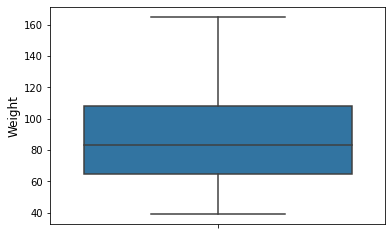

In [91]:
sns.boxplot(y = "Weight", data = data_iqr)
plt.yticks(fontsize=10)
plt.ylabel('Weight', fontsize=12)
plt.show()

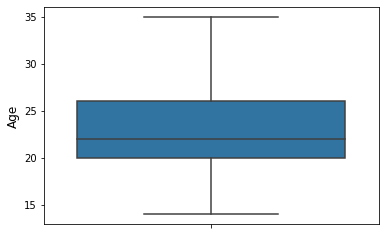

In [92]:
sns.boxplot(y = "Age", data = data_iqr)
plt.yticks(fontsize=10)
plt.ylabel('Age', fontsize=12)
plt.show()

In [97]:
# Data Preprocessing

#  Let's have a look at how many labels each variable has
for col in data_iqr.columns:
    print(col, ': ', len(data_iqr[col].unique()), 'labels')

Gender :  2 labels
Age :  22 labels
Height :  51 labels
Weight :  117 labels
family_history_with_overweight :  2 labels
FAVC :  2 labels
FCVC :  3 labels
NCP :  4 labels
CAEC :  4 labels
SMOKE :  2 labels
CH2O :  3 labels
SCC :  2 labels
FAF :  4 labels
TUE :  3 labels
CALC :  4 labels
MTRANS :  5 labels
NObeyesdad :  7 labels


In [107]:
# Do categorical transforms on all data
# One-Hot Encoding: used for nominal categorical variables. That is, variables that have no ordering among themselves.

data_iqr_ohe = data_iqr.copy()
one_hot_enc = OneHotEncoder(cols=['Gender', 'family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC', 'MTRANS'])
data_ohe = one_hot_enc.fit_transform(data_iqr_ohe)
data_ohe

,Gender_1,Gender_2,Age,Height,Weight,family_history_with_overweight_1,family_history_with_overweight_2,FAVC_1,FAVC_2,FCVC,...,SCC_2,FAF,TUE,CALC,MTRANS_1,MTRANS_2,MTRANS_3,MTRANS_4,MTRANS_5,NObeyesdad
0,1,0,21,1.62,64,1,0,1,0,2,...,0,0,1,no,1,0,0,0,0,Normal_Weight
1,1,0,21,1.52,56,1,0,1,0,3,...,1,3,0,Sometimes,1,0,0,0,0,Normal_Weight
2,0,1,23,1.80,77,1,0,1,0,2,...,0,2,1,Frequently,1,0,0,0,0,Normal_Weight
3,0,1,27,1.80,87,0,1,1,0,3,...,0,2,0,Frequently,0,1,0,0,0,Overweight_Level_I
4,0,1,22,1.78,90,0,1,1,0,2,...,0,0,0,Sometimes,1,0,0,0,0,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1,0,21,1.71,131,1,0,0,1,3,...,0,2,1,Sometimes,1,0,0,0,0,Obesity_Type_III
2107,1,0,22,1.75,134,1,0,0,1,3,...,0,1,1,Sometimes,1,0,0,0,0,Obesity_Type_III
2108,1,0,23,1.75,134,1,0,0,1,3,...,0,1,1,Sometimes,1,0,0,0,0,Obesity_Type_III
2109,1,0,24,1.74,133,1,0,0,1,3,...,0,1,1,Sometimes,1,0,0,0,0,Obesity_Type_III


In [109]:
data_ohe.select_dtypes(include='object').describe()

,CAEC,CALC,NObeyesdad
count,1950,1950,1950
unique,4,4,7
top,Sometimes,Sometimes,Obesity_Type_III
freq,1618,1311,323


In [114]:
# Ordinal Encoding:used for ordinal categorical variables
# Cols: CAEC, CALC, NObeyesdad

ord_enc = OrdinalEncoder(mapping= 
[{'col': 'CAEC', 'mapping': {'no':0, 'Sometimes':1, 'Frequently':2, 'Always':3}},
{'col': 'CALC', 'mapping': {'no': 0, 'Sometimes': 1, 'Frequently': 2, 'Always': 3}},
{'col':'NObeyesdad','mapping':{'Insufficient_Weight':0,'Normal_Weight':1,'Overweight_Level_I':2,'Overweight_Level_II':3,'Obesity_Type_I':4,'Obesity_Type_II':5,'Obesity_Type_III':6}}])


In [115]:
data_ord_enc = ord_enc.fit_transform(data_ohe)
data_ord_enc

,Gender_1,Gender_2,Age,Height,Weight,family_history_with_overweight_1,family_history_with_overweight_2,FAVC_1,FAVC_2,FCVC,...,SCC_2,FAF,TUE,CALC,MTRANS_1,MTRANS_2,MTRANS_3,MTRANS_4,MTRANS_5,NObeyesdad
0,1,0,21,1.62,64,1,0,1,0,2,...,0,0,1,0,1,0,0,0,0,1
1,1,0,21,1.52,56,1,0,1,0,3,...,1,3,0,1,1,0,0,0,0,1
2,0,1,23,1.80,77,1,0,1,0,2,...,0,2,1,2,1,0,0,0,0,1
3,0,1,27,1.80,87,0,1,1,0,3,...,0,2,0,2,0,1,0,0,0,2
4,0,1,22,1.78,90,0,1,1,0,2,...,0,0,0,1,1,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1,0,21,1.71,131,1,0,0,1,3,...,0,2,1,1,1,0,0,0,0,6
2107,1,0,22,1.75,134,1,0,0,1,3,...,0,1,1,1,1,0,0,0,0,6
2108,1,0,23,1.75,134,1,0,0,1,3,...,0,1,1,1,1,0,0,0,0,6
2109,1,0,24,1.74,133,1,0,0,1,3,...,0,1,1,1,1,0,0,0,0,6


In [123]:
# Regression
# OLS

X = data_ord_enc.iloc[:, :-1]
y = data_ord_enc.iloc[:,-1]

X = sm.add_constant(X)
model = sm.OLS(y,X) 
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:             NObeyesdad   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     2132.
Date:                Fri, 25 Jun 2021   Prob (F-statistic):               0.00
Time:                        11:38:14   Log-Likelihood:                -1139.8
No. Observations:                1950   AIC:                             2320.
Df Residuals:                    1930   BIC:                             2431.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

#### High R-squared. It means that the target is well influenced by the features.
Considering the p-value criterion, as the FCVC, CH2O, and TUE columns have a high p-value, it is understood that they didn't influence the target. 

In [156]:
# New model without FCVC, CH2O, and TUE columns
X2 = data_ord_enc.drop(['FCVC', 'CH2O', 'TUE', 'NObeyesdad'], axis=1)
y = data_ord_enc.iloc[:,-1]

X2 = sm.add_constant(X2)
model = sm.OLS(y,X2) 
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:             NObeyesdad   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     2535.
Date:                Sat, 26 Jun 2021   Prob (F-statistic):               0.00
Time:                        12:45:40   Log-Likelihood:                -1140.0
No. Observations:                1950   AIC:                             2314.
Df Residuals:                    1933   BIC:                             2409.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

#### The constant didn't change much and the R-squared is the same.

In [157]:
results.params

const                               2.280769
Gender_1                            1.103247
Gender_2                            1.177521
Age                                 0.032054
Height                             -7.484622
Weight                              0.076427
family_history_with_overweight_1    1.300206
family_history_with_overweight_2    0.980563
FAVC_1                              1.122252
FAVC_2                              1.158516
NCP                                 0.045345
CAEC                               -0.144659
SMOKE_1                             1.187133
SMOKE_2                             1.093636
SCC_1                               1.168538
SCC_2                               1.112230
FAF                                -0.079234
CALC                               -0.089802
MTRANS_1                            0.540775
MTRANS_2                            0.410988
MTRANS_3                            0.328396
MTRANS_4                            0.469979
MTRANS_5  

In [28]:
"""
# Regression
# Creating the Linear Regression Model with "Weight" and "Body Mass Index" columns.

X = data_encoder['Weight'].values.reshape(-1,1)
y = data_encoder['Body_Mass_Index'].values.reshape(-1,1)

reg = LinearRegression()
reg.fit(X,y)
"""

LinearRegression()

In [29]:
# print("The model is: Body Mass Index = {:.5} + {:.5}X".format(reg.intercept_[0], reg.coef_[0][0]))

The model is: Body Mass Index = -1.8815 + 0.069223X


In [30]:
# pred = reg.predict(X)

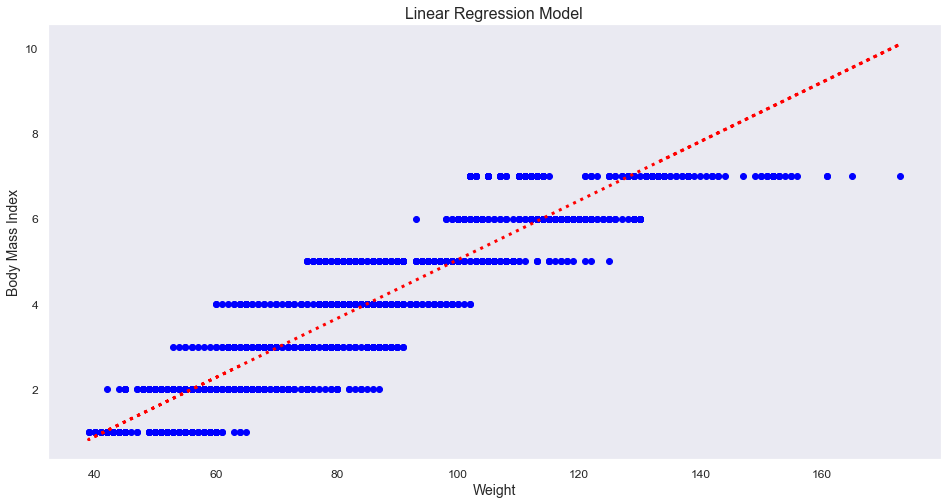

In [31]:
"""
plt.figure(figsize = (16,8))
plt.scatter(
    data_encoder['Weight'],
    data_encoder['Body_Mass_Index'],
    c = 'blue')

plt.plot(
    data_encoder['Weight'],
    pred,
    c = 'red',
    linewidth = 3,
    linestyle = ':')

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Weight', fontsize=14)
plt.ylabel('Body Mass Index', fontsize=14)
plt.title('Linear Regression Model', fontsize=16)
plt.show()
"""

In [32]:
"""
Xols = data_encoder['Weight']
yols = data_encoder['Body_Mass_Index']
X2 = sm.add_constant(Xols)
est = sm.OLS(yols,X2)
est2 = est.fit()
print(est2.summary())
"""

                            OLS Regression Results                            
Dep. Variable:        Body_Mass_Index   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                 1.060e+04
Date:                Wed, 05 May 2021   Prob (F-statistic):               0.00
Time:                        22:02:22   Log-Likelihood:                -2546.1
No. Observations:                2111   AIC:                             5096.
Df Residuals:                    2109   BIC:                             5108.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8815      0.061    -30.942      0.0

In [33]:
"""
# Training the model with the data set
Xlr = data_encoder.drop(['Body_Mass_Index'], axis = 1)
ylr = data_encoder['Body_Mass_Index']
"""

In [34]:
"""
# Separating training and test data
X_train, X_test, y_train, y_test = train_test_split(Xlr,ylr,test_size = .3, random_state=1)
"""

In [35]:
"""
# Model Training
lr = LinearRegression()
lr.fit(X_train,y_train)
"""

LinearRegression()

In [36]:
"""
pred_train = lr.predict(X_train)
pred_test = lr.predict(X_test)
"""

In [38]:
"""
# Performance Metrics
mae_test = mean_absolute_error(y_test, pred_test)
mape_test = mean_absolute_percentage_error(y_test, pred_test)
print('MAE_test: {:0.2f}'.format(mae_test))
print('MAPE_test: {:0.2f}'.format(mape_test))
"""

MAE_test: 0.38
MAPE_test: 0.14


In [39]:
"""
Cross Validation
result_cv = cross_val_score(lr, X_test, y_test, cv = 10)
print('Cross Validation: {}'.format(result_cv))
print("%0.2f accuracy with a standard deviation of %0.2f" % (result_cv.mean(), result_cv.std()))
"""

Cross Validation: [0.93720505 0.951772   0.92011071 0.9313185  0.93669104 0.95035293
 0.92906338 0.95732388 0.94004657 0.9233097 ]
0.94 accuracy with a standard deviation of 0.01


In [100]:
"""
# Creating the Linear Regression Model with "Age" and "Body Mass Index" columns.

X = data_encoder['Age'].values.reshape(-1,1)
y = data_encoder['Body_Mass_Index'].values.reshape(-1,1)

model = LinearRegression()
model.fit(X,y)
"""

LinearRegression()

In [101]:
# print("The model is: Body Mass Index = {:.5} + {:.5}X".format(model.intercept_[0], model.coef_[0][0]))

The model is: Body Mass Index = 1.9553 + 0.088708X


In [102]:
# predmodel = model.predict(X)

In [104]:
"""
Xols = data_encoder['Age']
yols = data_encoder['Body_Mass_Index']
X3 = sm.add_constant(Xols)
est = sm.OLS(yols,X3)
est3 = est.fit()
print(est3.summary())
"""

                            OLS Regression Results                            
Dep. Variable:        Body_Mass_Index   R-squared:                       0.081
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     185.1
Date:                Thu, 06 May 2021   Prob (F-statistic):           1.77e-40
Time:                        11:07:21   Log-Likelihood:                -4353.5
No. Observations:                2111   AIC:                             8711.
Df Residuals:                    2109   BIC:                             8722.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9553      0.164     11.933      0.0

In [40]:
"""
Clustering: K-means
Xc = data_encoder.iloc[:, [12,16]].values

print(Xc)
"""

[[0 2]
 [3 2]
 [2 2]
 ...
 [1 7]
 [1 7]
 [1 7]]


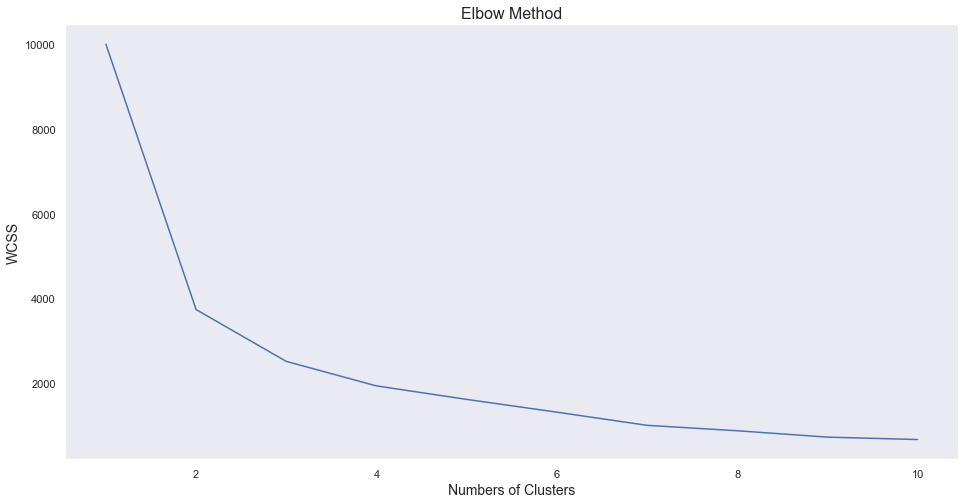

In [42]:
"""
Elbow Method
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(Xc)
    wcss.append(kmeans.inertia_)
plt.figure(figsize = (16,8))
plt.plot(range(1,11), wcss)
plt.xlabel('Numbers of Clusters', fontsize=14)
plt.ylabel('WCSS', fontsize=14)
plt.title('Elbow Method', fontsize=16)
plt.show()
"""

In [43]:
"""
k = 7
kmeans = KMeans(n_clusters = 7, random_state = 0)
pred_k = kmeans.fit_predict(Xc)
print(pred_k)
"""

[2 5 5 ... 1 1 1]


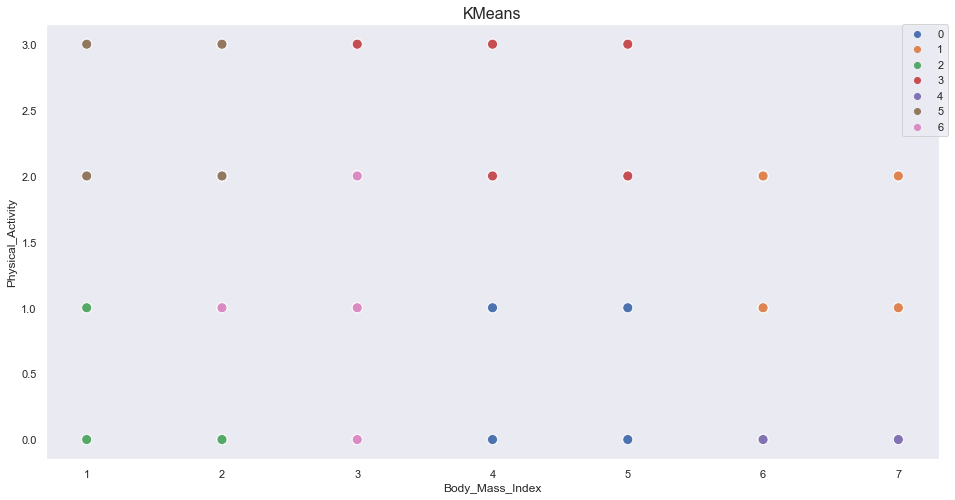

In [46]:
"""
plt.figure(figsize = (16,8))
sns.scatterplot(data = data_encoder, x = 'Body_Mass_Index', y = 'Physical_Activity', hue = pred_k, palette = "deep", s = 100)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
plt.title("KMeans", fontsize=16)
plt.show()
"""

In [47]:
"""
data_kmeans = dataset.copy()
data_kmeans['Cluster'] = pred_k
print(data_kmeans.head())
"""

   Gender   Age  Height  Weight Overweight_History  \
0  Female  21.0    1.62    64.0                yes   
1  Female  21.0    1.52    56.0                yes   
2    Male  23.0    1.80    77.0                yes   
3    Male  27.0    1.80    87.0                 no   
4    Male  22.0    1.78    89.8                 no   

  Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
0                             no                    2.0                3.0   
1                             no                    3.0                3.0   
2                             no                    2.0                3.0   
3                             no                    3.0                3.0   
4                             no                    2.0                1.0   

  Foods_between_Main_Meals Smoke  Drink_Water Calorie_Monitoring  \
0                Sometimes    no          2.0                 no   
1                Sometimes   yes          3.0                yes   
2 

In [48]:
"""
boolArray = data_kmeans['Cluster'] == 4
print(data_kmeans[boolArray])
"""

      Gender        Age    Height      Weight Overweight_History  \
68      Male  30.000000  1.760000  112.000000                yes   
197     Male  41.000000  1.750000  118.000000                yes   
202   Female  26.000000  1.560000  102.000000                yes   
210     Male  20.000000  1.800000  114.000000                yes   
229     Male  32.000000  1.750000  120.000000                yes   
...      ...        ...       ...         ...                ...   
2098  Female  25.992348  1.606474  104.954291                yes   
2099  Female  25.974446  1.628855  108.090006                yes   
2100  Female  25.777565  1.628205  107.378702                yes   
2101  Female  25.722004  1.628470  107.218949                yes   
2102  Female  25.765628  1.627839  108.107360                yes   

     Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
68                              yes                    1.0                3.0   
197                  

In [50]:
"""
Performance Metrics
kmeans_metrics = silhouette_score(Xc, kmeans.labels_, metric = 'euclidean')
print('The Silhouette_Score of K-means is: {:0.2f}'.format(kmeans_metrics))
"""

The Silhouette_Score of K-means is: 0.50


In [51]:
"""
Clustering: Agglomerative Hierarchical
Xc = data_encoder.iloc[:, [12,16]].values
"""

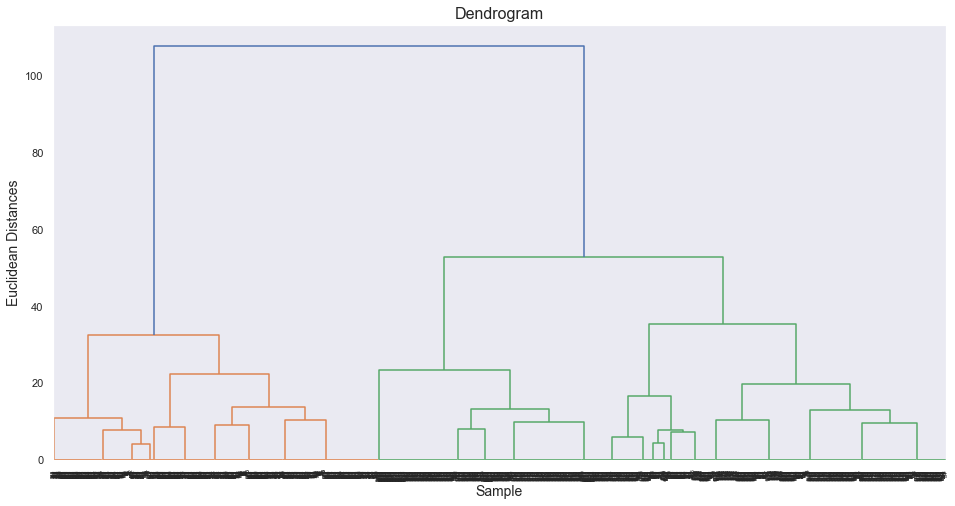

In [65]:
"""
plt.figure(figsize = (16,8))
hc = sch.dendrogram(sch.linkage(Xc, method = 'ward'))
plt.title('Dendrogram', fontsize=16)
plt.xlabel('Sample', fontsize=14)
plt.ylabel('Euclidean Distances', fontsize=14)
plt.show()
"""


In [54]:
"""
hc = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward' )
pred_h = hc.fit_predict(Xc)
"""

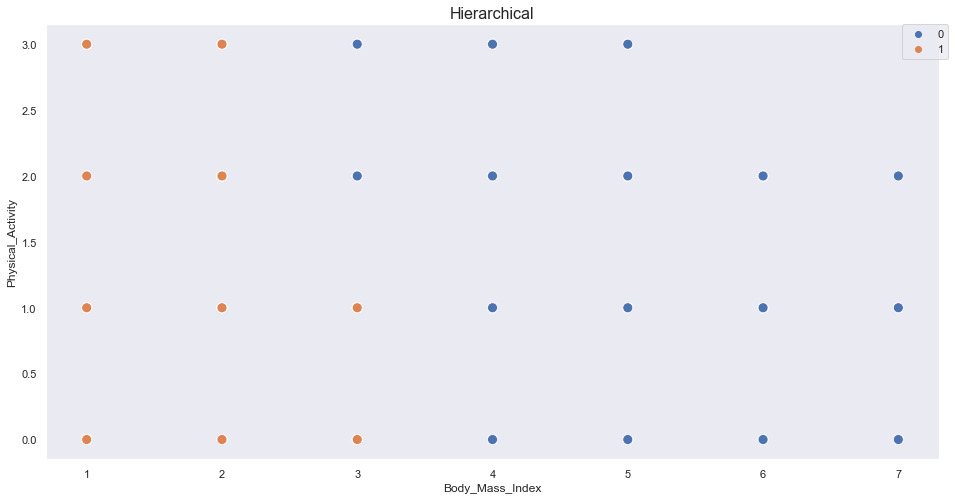

In [56]:
"""
plt.figure(figsize = (16,8))
sns.scatterplot(data = data_encoder, x = 'Body_Mass_Index', y = 'Physical_Activity', hue = pred_h, palette = "deep", s = 100)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
plt.title("Hierarchical", fontsize=16)
plt.show()
"""

In [57]:
"""
data_hc = dataset.copy()
data_hc['Cluster'] = pred_h
print(data_hc.head())
"""

   Gender   Age  Height  Weight Overweight_History  \
0  Female  21.0    1.62    64.0                yes   
1  Female  21.0    1.52    56.0                yes   
2    Male  23.0    1.80    77.0                yes   
3    Male  27.0    1.80    87.0                 no   
4    Male  22.0    1.78    89.8                 no   

  Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
0                             no                    2.0                3.0   
1                             no                    3.0                3.0   
2                             no                    2.0                3.0   
3                             no                    3.0                3.0   
4                             no                    2.0                1.0   

  Foods_between_Main_Meals Smoke  Drink_Water Calorie_Monitoring  \
0                Sometimes    no          2.0                 no   
1                Sometimes   yes          3.0                yes   
2 

In [58]:
"""
boolArrayhc = data_hc['Cluster'] == 0
print(data_hc[boolArrayhc])
"""

      Gender        Age    Height      Weight Overweight_History  \
3       Male  27.000000  1.800000   87.000000                 no   
4       Male  22.000000  1.780000   89.800000                 no   
10      Male  26.000000  1.850000  105.000000                yes   
11    Female  21.000000  1.720000   80.000000                yes   
13      Male  41.000000  1.800000   99.000000                 no   
...      ...        ...       ...         ...                ...   
2106  Female  20.976842  1.710730  131.408528                yes   
2107  Female  21.982942  1.748584  133.742943                yes   
2108  Female  22.524036  1.752206  133.689352                yes   
2109  Female  24.361936  1.739450  133.346641                yes   
2110  Female  23.664709  1.738836  133.472641                yes   

     Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
3                                no                    3.0                3.0   
4                    

In [59]:
"""
Performance Metrics
hc_metrics = silhouette_score(Xc, hc.labels_, metric = 'euclidean')
print('The Silhouette_Score of Hierarchical is: {:0.2f}'.format(hc_metrics))
"""

The Silhouette_Score of Hierarchical is: 0.49


In [66]:
"""
Clustering: DBSCAN
Xc = data_encoder.iloc[:, [12,16]].values
"""

In [67]:
"""
dbscan = DBSCAN(eps = .5, min_samples = 15)
dbscan.fit(Xc)
pred_d = dbscan.labels_
print(pred_d)
"""

[ 0  1  2 ... 24 24 24]


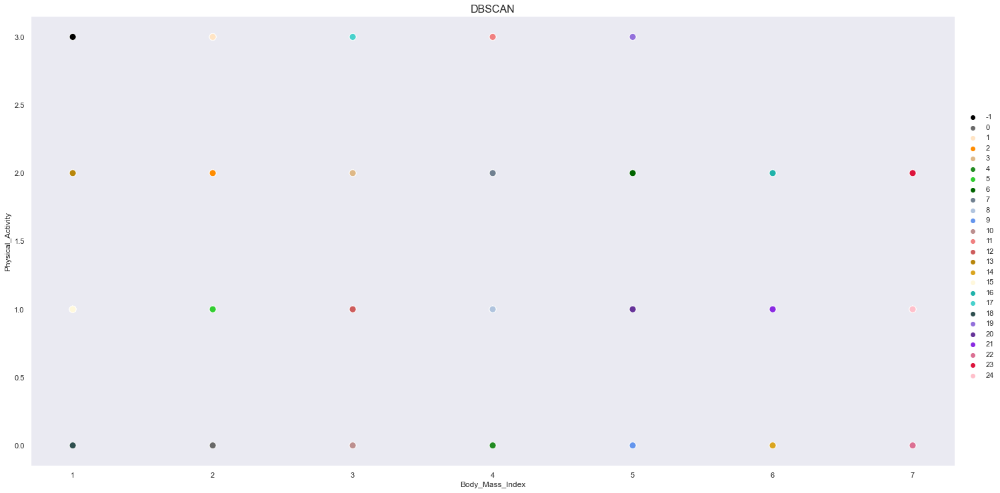

In [99]:
"""
sns.relplot(x = 'Body_Mass_Index', y = 'Physical_Activity', hue = pred_d, data = data_encoder, palette = ["black", "dimgray", "bisque", "darkorange", "burlywood", 
"forestgreen", "limegreen", "darkgreen", "slategrey", "lightsteelblue", "cornflowerblue", "rosybrown", "lightcoral", "indianred", "darkgoldenrod",
"goldenrod", "cornsilk", "lightseagreen", "mediumturquoise", "darkslategray", "mediumpurple", "rebeccapurple", "blueviolet", "palevioletred", "crimson",
"pink"], s = 100, height=10,aspect=2)
plt.title("DBSCAN", fontsize=16)
plt.show()
"""

In [81]:
"""
data_d = dataset.copy()
data_d['Cluster'] = pred_d
print(data_d.head())
"""

   Gender   Age  Height  Weight Overweight_History  \
0  Female  21.0    1.62    64.0                yes   
1  Female  21.0    1.52    56.0                yes   
2    Male  23.0    1.80    77.0                yes   
3    Male  27.0    1.80    87.0                 no   
4    Male  22.0    1.78    89.8                 no   

  Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
0                             no                    2.0                3.0   
1                             no                    3.0                3.0   
2                             no                    2.0                3.0   
3                             no                    3.0                3.0   
4                             no                    2.0                1.0   

  Foods_between_Main_Meals Smoke  Drink_Water Calorie_Monitoring  \
0                Sometimes    no          2.0                 no   
1                Sometimes   yes          3.0                yes   
2 

In [82]:
"""
boolArraydb = data_d['Cluster'] == 22
print(data_d[boolArraydb])
"""

      Gender        Age    Height      Weight Overweight_History  \
202   Female  26.000000  1.560000  102.000000                yes   
403   Female  26.000000  1.660000  112.000000                yes   
498   Female  25.196214  1.686306  104.572712                yes   
500   Female  26.000000  1.622397  110.792630                yes   
502   Female  21.900120  1.843419  165.057269                yes   
...      ...        ...       ...         ...                ...   
2098  Female  25.992348  1.606474  104.954291                yes   
2099  Female  25.974446  1.628855  108.090006                yes   
2100  Female  25.777565  1.628205  107.378702                yes   
2101  Female  25.722004  1.628470  107.218949                yes   
2102  Female  25.765628  1.627839  108.107360                yes   

     Hypercaloric_Foods_Consumption  Vegetable_Consumption  Main_Meals_Number  \
202                             yes                    3.0                3.0   
403                  

In [83]:
"""
Performance Metrics
dbscan_metrics = silhouette_score(Xc, dbscan.labels_, metric = 'euclidean')
print('The Silhouette_Score of DBSCAN is: {:0.2f}'.format(dbscan_metrics))
"""

The Silhouette_Score of DBSCAN is: 1.00


In [84]:
"""
Classification
Training the model with the data set
Xlor = data_encoder.drop(['Body_Mass_Index'], axis = 1)
ylor = data_encoder['Body_Mass_Index']
"""

In [85]:
"""
Separating training and test data
X_train, X_test, y_train, y_test = train_test_split(Xlor,ylor,test_size = .3,random_state=1)
"""

In [86]:
"""
Logistic Regression Classifier
lor = LogisticRegression()
lor.fit(X_train,y_train)
"""

c:\Users\RenanSardinha\Documents\Data Science\EstimatedObesityLevels\venv\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [87]:
"""
pred_train_lor = lor.predict(X_train)
pred_test_lor = lor.predict(X_test)
"""

In [88]:
"""
print('Accuracy of Logistic Regression Classifier on test set: {:.2f}'.format(lor.score(X_test,y_test)))
print('Accuracy of Logistic Regression Classifier on train set: {:.2f}'.format(lor.score(X_train,y_train)))
"""

Accuracy of Logistic Regression Classifier on test set: 0.70
Accuracy of Logistic Regression Classifier on train set: 0.71


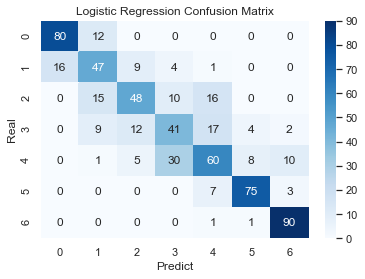

In [89]:
"""
Confusion Matrix
cmlr = confusion_matrix(y_test, pred_test_lor)
sns.heatmap(cmlr,annot=True,fmt='g',cmap="Blues")
plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predict")
plt.ylabel("Real")
plt.show()
"""

In [90]:
"""
Decision Tree Classifier
tree = DecisionTreeClassifier()
tree.fit(X_train,y_train)
"""

DecisionTreeClassifier()

In [91]:
"""
pred_train_tree = tree.predict(X_train)
pred_test_tree = tree.predict(X_test)
"""

In [92]:
"""
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(tree.score(X_test,y_test)))
print('Accuracy of Decision Tree Classifier on train set: {:.2f}'.format(tree.score(X_train,y_train)))
"""

Accuracy of Decision Tree Classifier on test set: 0.91
Accuracy of Decision Tree Classifier on train set: 1.00


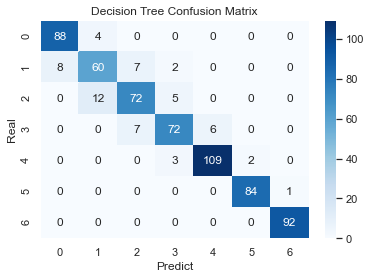

In [93]:
"""
Confusion Matrix
cmdt = confusion_matrix(y_test, pred_test_tree)
sns.heatmap(cmdt,annot=True,fmt='g',cmap="Blues")
plt.title("Decision Tree Confusion Matrix")
plt.xlabel("Predict")
plt.ylabel("Real")
plt.show()
"""

In [94]:
"""
Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
"""

RandomForestClassifier()

In [95]:
"""
pred_train_rf = rf.predict(X_train)
pred_test_rf = rf.predict(X_test)
"""

In [96]:
"""
print('Accuracy of Random Forest Classifier on test set: {:.2f}'.format(rf.score(X_test,y_test)))
print('Accuracy of Random Forest Classifier on train set: {:.2f}'.format(rf.score(X_train,y_train)))
"""

Accuracy of Random Forest Classifier on test set: 0.93
Accuracy of Random Forest Classifier on train set: 1.00


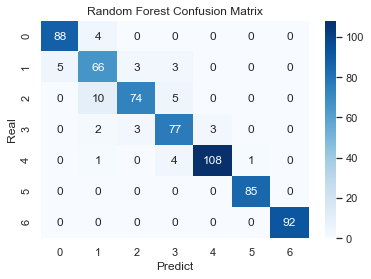

In [97]:
"""
Confusion Matrix
cmrf = confusion_matrix(y_test, pred_test_rf)
sns.heatmap(cmrf,annot=True,fmt='g',cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predict")
plt.ylabel("Real")
plt.show()
"""